# **Lab 1.2 Image Visualization & Image Arithmetic Operation**

In [1]:
import cv2
import numpy as np
import math
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import mpl_toolkits
import os
import matplotlib.animation as animation
from IPython.display import HTML

### **Color Model Visualization**
In this part, you will explore and visualize different color models by separating and displaying each channel individually. The color models we will work with include RGB, HSV, HLS, and YCrCb.<br>

**HINT**: `cv2.cvtColor()`

Display each channel for each color model in RGB space use `direct slicing method (array[...])`.<br>
**Color model:**
- RGB
- HSV
- HLS
- YCrCb



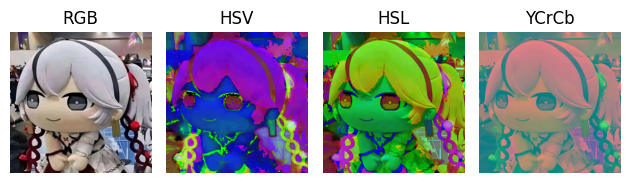

In [2]:
### START CODE HERE ###

img = cv2.imread("asset/Camellya.webp")
RGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
HSV = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
HSL = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
YCrCb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)

fig, axs = plt.subplots(1, 4)
axs[0].imshow(RGB)
axs[0].set_title("RGB")
axs[1].imshow(HSV)
axs[1].set_title("HSV")
axs[2].imshow(HSL)
axs[2].set_title("HSL")
axs[3].imshow(YCrCb)
axs[3].set_title("YCrCb")
for ax in axs:
    ax.axis('off')

plt.tight_layout()
plt.show()
### END CODE HERE ###

<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab1_image-representation/asset/2-1.png)

</details>

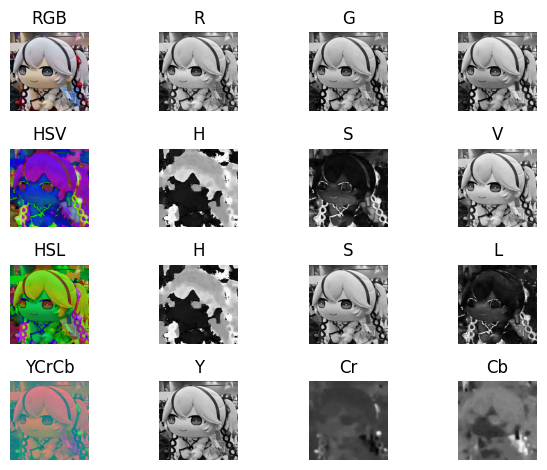

In [3]:
### START CODE HERE ###
fig, axs = plt.subplots(4,4)

axs[0, 0].imshow(RGB)
axs[0, 0].set_title("RGB")  
axs[1, 0].imshow(HSV)
axs[1, 0].set_title("HSV")
axs[2, 0].imshow(HSL)
axs[2, 0].set_title("HSL")
axs[3, 0].imshow(YCrCb)
axs[3, 0].set_title("YCrCb")

axs[0, 1].imshow(RGB[:, :, 0], cmap='gray')
axs[0, 1].set_title("R")
axs[0, 2].imshow(RGB[:, :, 1], cmap='gray')
axs[0, 2].set_title("G")
axs[0, 3].imshow(RGB[:, :, 2], cmap='gray')
axs[0, 3].set_title("B")


axs[1, 1].imshow(HSV[:, :, 0], cmap='gray')
axs[1, 1].set_title("H")
axs[1, 2].imshow(HSV[:, :, 1], cmap='gray')
axs[1, 2].set_title("S")
axs[1, 3].imshow(HSV[:, :, 2], cmap='gray')
axs[1, 3].set_title("V")

axs[2, 1].imshow(HSL[:, :, 0], cmap='gray')
axs[2, 1].set_title("H")
axs[2, 2].imshow(HSL[:, :, 1], cmap='gray')
axs[2, 2].set_title("S")
axs[2, 3].imshow(HSL[:, :, 2], cmap='gray')
axs[2, 3].set_title("L")

axs[3, 1].imshow(YCrCb[:, :, 0], cmap='gray')
axs[3, 1].set_title("Y")
axs[3, 2].imshow(YCrCb[:, :, 1], cmap='gray')
axs[3, 2].set_title("Cr")
axs[3, 3].imshow(YCrCb[:, :, 2], cmap='gray')
axs[3, 3].set_title("Cb")

for ax in axs.flat:
    ax.axis('off')

plt.tight_layout()
plt.show()









### END CODE HERE ###

### **Images addition**
In this part, you will read two images using OpenCV and combine them using a weighted addition. You will explore how changing the weights affects the resulting image.

Read 2 images using OpenCV. Use your own images.

<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab1_image-representation/asset/2-2.png)

</details>

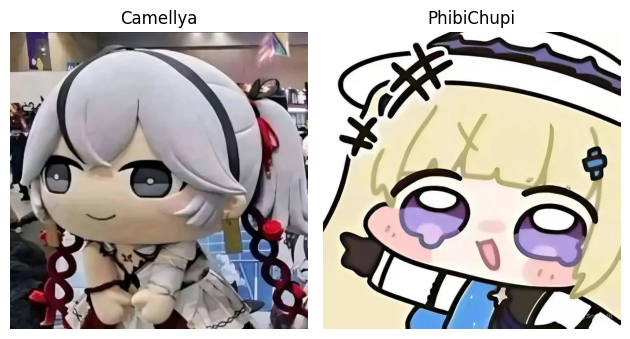

In [4]:
### START CODE HERE ###

img1 = cv2.imread("asset/Camellya.webp")
img2 = cv2.imread("asset/PhibiChupi.webp")

fig, axs = plt.subplots(1, 2)
axs[0].imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
axs[0].set_title("Camellya")
axs[1].imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))    
axs[1].set_title("PhibiChupi")
for ax in axs:
    ax.axis('off')

plt.tight_layout()
plt.show()

### END CODE HERE ###

Complete `img_addition()` in the cell below.
$$
\begin{align*}
Im\_addition &= w_1Im_1+w_2Im_2 \\
w_1 + w_2 &= 1.0
\end{align*}
$$

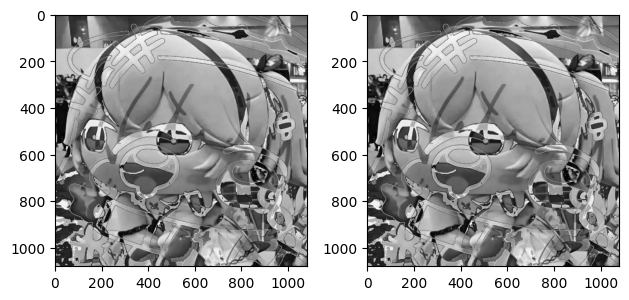

In [24]:
### START CODE HERE ###
a = cv2.imread("asset/Camellya.webp")
b = cv2.imread("asset/PhibiChupi.webp")
reB = cv2.resize(b, (a.shape[1], a.shape[0]))

def img_addition(img1,img2,w1,w2):
    img_add = w1 * img1 + w2 * img2
    img_add = np.clip(img_add, 0, 255).astype(np.uint8)
    return img_add
### END CODE HERE ###

sub = img_addition(a, reB, 1, 1)
sub2 = img_addition(reB, a, 1, 1)
fig, ax = plt.subplots(1,2)
ax[0].imshow(cv2.cvtColor(sub, cv2.COLOR_BGR2GRAY) , cmap='gray')
ax[1].imshow(cv2.cvtColor(sub2, cv2.COLOR_BGR2GRAY) , cmap='gray')

plt.tight_layout()
plt.show()

If you code work properly, the cell below should run without error.

In [25]:
a = np.full((20, 20), 255)
b = np.full((20, 20), 255)
test_result = img_addition(a,b,1,1)
assert np.min(test_result) >= 0 and np.max(test_result) <= 255, \
    f"Pixel value out of range: min={np.min(test_result)}, max={np.max(test_result)}"

Use the `img_addition()` function here and save the result to an array for creating a video in a later part. Use weight values in the range [0, 1] with ***at least 20 steps***, ***first increasing from 0 to 1 and then decreasing from 1 back to 0***.

In [26]:
### START CODE HERE ###
# Read images
img1 = cv2.imread("asset/Camellya.webp")
img2 = cv2.imread("asset/PhibiChupi.webp")

if img1.shape != img2.shape:
    img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]))

steps = 20
weights_up = np.linspace(0, 1, steps)
weights_down = np.linspace(1, 0, steps)
weights = np.concatenate([weights_up, weights_down[1:]])

image_array = []
for w in weights:
    result = img_addition(img1, img2, 1-w, w)
    image_array.append(result)

image_array = np.array(image_array)


 
### END CODE HERE ###

Save the array of images to a video. Please complete the function below.

In [27]:
### START CODE HERE ###
def write_images_to_video(image_array, output_file, frame_rate=30):
    height, width = image_array[0].shape[:2]
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_file, fourcc, frame_rate, (width, height))

    for img in image_array:
        if img.shape[2] == 3:
            out.write(img)
        else:
            out.write(cv2.cvtColor(img, cv2.COLOR_GRAY2BGR))
    out.release()

    
### END CODE HERE ###

Use `write_images_to_video()` and save the result.

In [28]:
output_folder = "output"
os.makedirs(output_folder, exist_ok=True)

output_file =  os.path.join(output_folder, "output_image_add.mp4")
write_images_to_video(image_array, output_file)

Now use `matplotlib.animation` to display the animation from the images array.

In [29]:
%%capture
### START CODE HERE ###

fig, ax = plt.subplots()
frames = [[ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), animated=True)] for img in image_array]
ani = animation.ArtistAnimation(fig, frames, interval=100, blit=True, repeat_delay=500)
### END CODE HERE ###

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![addition-2.gif](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab1_image-representation/asset/addition.gif)

</details>

In [30]:
display(HTML(ani.to_jshtml()))

### **Image Bitwise AND operation**
Complete the `create_image_mask()` function in the cell below. Use `np.zeros()` and fill the desired area with 255. This function will return a mask.

In [12]:
### START CODE HERE ###
def create_image_mask(height, width, x, y):
    image_mask = np.zeros((height, width), dtype=np.uint8)
    # cv2.circle(image_mask, (x, y), 50, 255, -1)
    cv2.rectangle(image_mask, (x-500, y-500), (x+50, y+50), 255, -1)

    return image_mask
### END CODE HERE ###

Use your `create_image_mask()` here and display your mask.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab1_image-representation/asset/2-3.png)

</details>

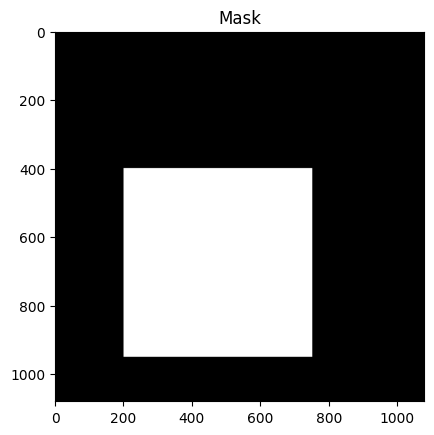

In [13]:
### START CODE HERE ###
img1 = plt.imread("asset/Camellya.webp")
   
image_mask = create_image_mask(img1.shape[0], img1.shape[1], 700, 900)
plt.imshow(image_mask,cmap='gray')
plt.title('Mask')
plt.show()
### END CODE HERE ###

Perform the bitwise AND operation between the image and the mask. Then, display the output as shown in the reference image below.

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab1_image-representation/asset/2-4.png)

</details>

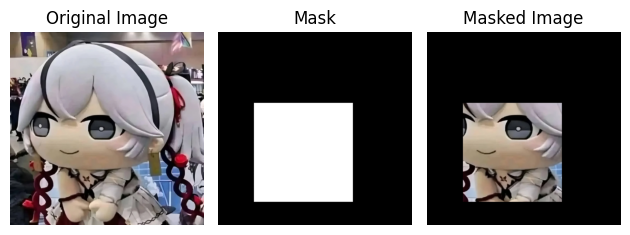

In [14]:
### START CODE HERE ###
fig, axs = plt.subplots(1, 3)

axs[0].imshow(img1)
axs[0].set_title("Original Image")
axs[1].imshow(image_mask, cmap='gray')
axs[1].set_title("Mask")
axs[2].imshow(cv2.bitwise_and(img1, img1, mask=image_mask))
axs[2].set_title("Masked Image")
for ax in axs:
    ax.axis('off')
plt.tight_layout()


plt.show()
### END CODE HERE ###

---

## **Question**
1. When performing image subtraction, how does the order of the images (im1-im2 vs. im2-im1) affect the  resulting image?
2. If we want to censor a part of an image, explain your designed mask and the process using logic operation.
3. How would we obtain background of the scene if there are objects moving all the time and some objects moving very slow and sometimes stay still?

## **Answer**
1. ลำดับของรูปมีผลต่อผลลัพท์ เพราะค่า pixels ในแต่ละจุดอาจมีค่าต่างกัน เช่น
    - เมื่อ pixels ในรูปตัวตั้งมีค่า pixels ที่มากกว่า(สว่างกว่า) ลบกับรูปที่มีค่า pixels ต่ำกว่า(มืดกว่า) จะทำให้สีของรูป  
      ณ จุดนั้นๆ มีความสว่างที่น้อยลง
    - ในทางกลับกัน เมื่อค่า pixels ในรูปตัวตั้งมีค่าต่ำกว่า(มืดกว่า) ลบกับรูปที่มีค่า pixels ที่มากกว่า(สว่างกว่า) 
      เมื่อลบกันในแบบปกติค่าที่ได้จะเป็นค่าติดลบ แต่ใน uint8 จะเป็นการวนกลับไปที่ตัวท้าย (255) แล้วลดตามที่เราลบออก และจะทำให้สีที่ได้ผิดแปลกไป

2.  - เตรียม Mask สีขาวแล้วกำหนดพื้นที่ที่ต้องการ censor เป็นสีดำ
    - นำรูปที่ต้องการ censor มา AND กับ mask จะได้รูปที่ censor มา

3.  - นำแต่ละ frame ของ video มาทำ background subtraction จะได้ส่วนที่วัตถุที่เคลื่อนที่ นำส่วนที่เป็นวัตถุเคลื่อนที่มาทำ 
      mask และ AND กับ Background เราจะได้ background scene มา
    - ในส่วนของวัตถุที่เคลื่อนที่ช้า หรือ หยุดชั่วคราว จะใช้วีธีหาค่า median ของหลายๆ frame     
      เมื่อค่ามีการเปลี่ยนแปลงอย่างเป็นนัยสำคัญ ก็จะถือว่าเป็น วัตถุที่เคลื่อนที่